# Denoising Difusion Model for MNIST #

In [1]:
# Number of workers for training
num_workers = 4
# Batch size during training
batch_size = 512
# Spatial size of training images
image_size = 28 #64
# Number of channels in the training images. For color images this is 3. For grayscale image (e.g. MNIST) is 1.
nc = 1
# Size of z latent vector (i.e. size of generator input)
nz = 100
# Size of feature maps in generator
ngf = 32
# Size of feature maps in discriminator
ndf = 32
# Number of training epochs
num_epochs = 20
# Learning rate for optimizers
lr = 0.0002
# Beta1 hyperparam for Adam optimizers
beta1 = 0.5
# Beta2 hyperparam for Adam optimizers
beta2 = 0.999
# KLD weight for loss function
kld_weight = 1.e-2

## Step1. Data loader ##

In [2]:
import os
import torch
from torch.utils.data import Dataset

from pytorch_lightning import LightningDataModule
from torch.utils.data import DataLoader, random_split
from torchvision.datasets import MNIST
from torchvision import transforms
from typing import Optional

torch.manual_seed(111)


class MNISTDataset(LightningDataModule):
    def __init__(
        self,
        data_path: str,
        batch_size: int = 128,
        num_workers: int = num_workers
        ):
        super().__init__()
        self.data_dir = data_path
        self.transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.5), (0.5))])
        self.batch_size = batch_size
        self.num_workers = num_workers

    def setup(self, stage: Optional[str] = None) -> None:
        full_data = MNIST(os.getcwd(), train=True,  download=True, transform=self.transform)
        self.train_data, self.val_data = random_split(full_data, [50000, 10000])
        self.test_data  = MNIST(os.getcwd(), train=False, download=True, transform=self.transform)
        self.pred_data  = self.train_data
        
    def train_dataloader(self):
        return DataLoader(self.train_data, batch_size=self.batch_size, num_workers=self.num_workers)

    def val_dataloader(self):
        return DataLoader(self.val_data, batch_size=self.batch_size, num_workers=self.num_workers)

    def test_dataloader(self):
        return DataLoader(self.test_data, batch_size=self.batch_size, num_workers=self.num_workers)
    
    def predict_dataloader(self):
        return DataLoader(self.pred_data, batch_size=self.batch_size, num_workers=self.num_workers)

## Step1. Data loader (FashionMNIST) ##

In [3]:
from torchvision.datasets import FashionMNIST

class FashionMNISTDataset(LightningDataModule):
    def __init__(
        self,
        data_path: str,
        batch_size: int = 128,
        num_workers: int = num_workers
        ):
        super().__init__()
        self.data_dir = data_path
        self.transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.5), (0.5))])
        self.batch_size = batch_size
        self.num_workers = num_workers

    def setup(self, stage: Optional[str] = None) -> None:
        full_data = FashionMNIST(os.getcwd(), train=True,  download=True, transform=self.transform)
        self.train_data, self.val_data = random_split(full_data, [50000, 10000])
        self.test_data  = FashionMNIST(os.getcwd(), train=False, download=True, transform=self.transform)
        self.pred_data  = self.train_data
        
    def train_dataloader(self):
        return DataLoader(self.train_data, batch_size=self.batch_size, num_workers=self.num_workers)

    def val_dataloader(self):
        return DataLoader(self.val_data, batch_size=self.batch_size, num_workers=self.num_workers)

    def test_dataloader(self):
        return DataLoader(self.test_data, batch_size=self.batch_size, num_workers=self.num_workers)
    
    def predict_dataloader(self):
        return DataLoader(self.pred_data, batch_size=self.batch_size, num_workers=self.num_workers)

In [4]:
#loader = FashionMNISTDataset(data_path='./', batch_size=batch_size)
#loader.setup()

In [5]:
#for i in loader.train_dataloader():
#    print(len(i), i[0].shape)

## Step2. Denoising Defusion Model ##

In [6]:
from torch import nn

class MyDDPM(nn.Module):
    def __init__(self, network, n_steps=1000, min_beta=10 ** -4, max_beta=0.02, image_chw=(1, 28, 28)):
        super(MyDDPM, self).__init__()
        self.n_steps = n_steps
        #self.device = device
        self.image_chw = image_chw
        #self.network = network.to(self.device)
        self.network = network
        #self.betas = torch.linspace(min_beta, max_beta, n_steps).to(self.device)  # Number of steps is typically in the order of thousands
        self.betas = torch.linspace(min_beta, max_beta, n_steps)
        self.alphas = 1 - self.betas
        #self.alpha_bars = torch.tensor([torch.prod(self.alphas[:i + 1]) for i in range(len(self.alphas))]).to(self.device)
        self.alpha_bars = torch.tensor([torch.prod(self.alphas[:i + 1]) for i in range(len(self.alphas))])

    def forward(self, x0, t, eta=None):
        #print('ddpm')
        # Make input image more noisy (we can directly skip to the desired step)
        n, c, h, w = x0.shape
        #print('n', n)
        #print('self.device', self.device)
        a_bar = self.alpha_bars.to(t.device)[t]
        ##print('t',type(t), t.device)
        #print(t)
        #print('self.alpha_bars', type(self.alpha_bars), self.alpha_bars.device)
        #print('a_bar')
        if eta is None:
            #print('eta is none')
            eta = torch.randn(n, c, h, w)#.to(self.device)
            ##print('eta is none')
        #print('eta', eta)
        noisy = a_bar.sqrt().reshape(n, 1, 1, 1) * x0 + (1 - a_bar).sqrt().reshape(n, 1, 1, 1) * eta
        #print('noisy', noisy)
        return noisy

    def backward(self, x, t):
        # Run each image through the network for each timestep t in the vector t.
        # The network returns its estimation of the noise that was added.
        return self.network(x, t)

In [7]:
class MyBlock(nn.Module):
    def __init__(self, shape, in_c, out_c, kernel_size=3, stride=1, padding=1, activation=None, normalize=True):
        super(MyBlock, self).__init__()
        self.ln = nn.LayerNorm(shape)
        self.conv1 = nn.Conv2d(in_c, out_c, kernel_size, stride, padding)
        self.conv2 = nn.Conv2d(out_c, out_c, kernel_size, stride, padding)
        self.activation = nn.SiLU() if activation is None else activation
        self.normalize = normalize

    def forward(self, x):
        #print('block')
        out = self.ln(x) if self.normalize else x
        out = self.conv1(out)
        out = self.activation(out)
        out = self.conv2(out)
        out = self.activation(out)
        return out

In [8]:
class MyUNet(nn.Module):
    def __init__(self, n_steps=1000, time_emb_dim=100):
        super(MyUNet, self).__init__()

        # Sinusoidal embedding
        self.time_embed = nn.Embedding(n_steps, time_emb_dim)
        self.time_embed.weight.data = self.sinusoidal_embedding(n_steps, time_emb_dim)
        self.time_embed.requires_grad_(False)

        # First half
        self.te1 = self._make_te(time_emb_dim, 1)
        self.b1 = nn.Sequential(
            MyBlock((1, 28, 28), 1, 10),
            MyBlock((10, 28, 28), 10, 10),
            MyBlock((10, 28, 28), 10, 10)
        )
        self.down1 = nn.Conv2d(10, 10, 4, 2, 1)

        self.te2 = self._make_te(time_emb_dim, 10)
        self.b2 = nn.Sequential(
            MyBlock((10, 14, 14), 10, 20),
            MyBlock((20, 14, 14), 20, 20),
            MyBlock((20, 14, 14), 20, 20)
        )
        self.down2 = nn.Conv2d(20, 20, 4, 2, 1)

        self.te3 = self._make_te(time_emb_dim, 20)
        self.b3 = nn.Sequential(
            MyBlock((20, 7, 7), 20, 40),
            MyBlock((40, 7, 7), 40, 40),
            MyBlock((40, 7, 7), 40, 40)
        )
        self.down3 = nn.Sequential(
            nn.Conv2d(40, 40, 2, 1),
            nn.SiLU(),
            nn.Conv2d(40, 40, 4, 2, 1)
        )

        # Bottleneck
        self.te_mid = self._make_te(time_emb_dim, 40)
        self.b_mid = nn.Sequential(
            MyBlock((40, 3, 3), 40, 20),
            MyBlock((20, 3, 3), 20, 20),
            MyBlock((20, 3, 3), 20, 40)
        )

        # Second half
        self.up1 = nn.Sequential(
            nn.ConvTranspose2d(40, 40, 4, 2, 1),
            nn.SiLU(),
            nn.ConvTranspose2d(40, 40, 2, 1)
        )

        self.te4 = self._make_te(time_emb_dim, 80)
        self.b4 = nn.Sequential(
            MyBlock((80, 7, 7), 80, 40),
            MyBlock((40, 7, 7), 40, 20),
            MyBlock((20, 7, 7), 20, 20)
        )

        self.up2 = nn.ConvTranspose2d(20, 20, 4, 2, 1)
        self.te5 = self._make_te(time_emb_dim, 40)
        self.b5 = nn.Sequential(
            MyBlock((40, 14, 14), 40, 20),
            MyBlock((20, 14, 14), 20, 10),
            MyBlock((10, 14, 14), 10, 10)
        )

        self.up3 = nn.ConvTranspose2d(10, 10, 4, 2, 1)
        self.te_out = self._make_te(time_emb_dim, 20)
        self.b_out = nn.Sequential(
            MyBlock((20, 28, 28), 20, 10),
            MyBlock((10, 28, 28), 10, 10),
            MyBlock((10, 28, 28), 10, 10, normalize=False)
        )

        self.conv_out = nn.Conv2d(10, 1, 3, 1, 1)

    def forward(self, x, t):
        #print('UNet')
        # x is (N, 2, 28, 28) (image with positional embedding stacked on channel dimension)
        t = self.time_embed(t)
        n = len(x)
        out1 = self.b1(x + self.te1(t).reshape(n, -1, 1, 1))  # (N, 10, 28, 28)
        out2 = self.b2(self.down1(out1) + self.te2(t).reshape(n, -1, 1, 1))  # (N, 20, 14, 14)
        out3 = self.b3(self.down2(out2) + self.te3(t).reshape(n, -1, 1, 1))  # (N, 40, 7, 7)

        out_mid = self.b_mid(self.down3(out3) + self.te_mid(t).reshape(n, -1, 1, 1))  # (N, 40, 3, 3)

        out4 = torch.cat((out3, self.up1(out_mid)), dim=1)  # (N, 80, 7, 7)
        out4 = self.b4(out4 + self.te4(t).reshape(n, -1, 1, 1))  # (N, 20, 7, 7)

        out5 = torch.cat((out2, self.up2(out4)), dim=1)  # (N, 40, 14, 14)
        out5 = self.b5(out5 + self.te5(t).reshape(n, -1, 1, 1))  # (N, 10, 14, 14)

        out = torch.cat((out1, self.up3(out5)), dim=1)  # (N, 20, 28, 28)
        out = self.b_out(out + self.te_out(t).reshape(n, -1, 1, 1))  # (N, 1, 28, 28)

        out = self.conv_out(out)

        return out

    def _make_te(self, dim_in, dim_out):
        return nn.Sequential(
            nn.Linear(dim_in, dim_out),
            nn.SiLU(),
            nn.Linear(dim_out, dim_out)
        )

    def sinusoidal_embedding(self, n, d):
        # Returns the standard positional embedding
        embedding = torch.zeros(n, d)
        wk = torch.tensor([1 / 10_000 ** (2 * j / d) for j in range(d)])
        wk = wk.reshape((1, d))
        t = torch.arange(n).reshape((n, 1))
        embedding[:,::2] = torch.sin(t * wk[:,::2])
        embedding[:,1::2] = torch.cos(t * wk[:,::2])

        return embedding

## Step3. Lightning module ##

In [9]:
from typing import Any, Optional
from pytorch_lightning.utilities.types import STEP_OUTPUT
from torch.nn import functional as F
from torch import optim
from torch import Tensor
from pytorch_lightning import LightningModule
from torchvision.utils import make_grid
from torchmetrics.image.fid import FrechetInceptionDistance


class lmDDPM(LightningModule):
    def __init__(
        self,
        lr: float = lr,
        b1: float = beta1,
        b2: float = beta2,
        batch_size : int = 128,
        kld_weight: float = kld_weight,
        **kwargs
    ):
        super().__init__()
        self.save_hyperparameters()

        self.unet = MyUNet(n_steps=1000)
        self.ddpm = MyDDPM(self.unet, min_beta=1.0e-4, max_beta=0.02)

        self.automatic_optimization = False
        self.training_step_loss = []
        self.training_epoch_losses = []

        self.e_example = None
        self.d_example = {}
        self.z_example = {}
        self.zq_example = {}

    def forward(self, x,t,eta):
        return self.ddpm(x,t,eta)



    def critic(self, fake_image, image):
        mse_loss = F.mse_loss(fake_image, image)

        return mse_loss



    def configure_optimizers(self):
        lr = self.hparams.lr
        b1 = self.hparams.b1
        b2 = self.hparams.b2
        opt = torch.optim.Adam(self.parameters())

        return opt

    def training_step(self, batch, batch_size):
        images, _ = batch

        #print('img', images.shape)
        #print('self.device', self.device)

        opt = self.optimizers()
        opt.zero_grad()

        n_steps = 1000
        x0 = batch[0]
        n = len(x0)

        #print('n', n)

        eta = torch.randn_like(batch[0]).to(self.device)
        #print('eta', eta)
        t = torch.randint(0, n_steps, (n,)).to(self.device)
        #print('t',t)

        noisy_imgs = self(x0, t, eta)
        #print('noisy_imgs', noisy_imgs)

        eta_theta = self.ddpm.backward(noisy_imgs, t.reshape(n, -1))


        #self.z_sample  = z

        loss = self.critic(eta_theta, eta)

        self.manual_backward(loss)
        opt.step()

        self.log('loss', loss, prog_bar=True, on_step=True)
        self.training_step_loss.append(loss)

        return loss

    def validation_step(self, batch, batch_size) -> None:
        images, _ = batch
        if self.e_example == None:
            self.e_example = images[:64]

    def predict_step(self, batch):
        images, _ = batch
        if self.e_example == None:
            self.e_example = images[:64]

        #z = self.encoder(images)
        #self.z_sample  = z
        #zq, _, _ = self.vq(z)
        #recon_images = self(zq)

    def generate(self, n_samples, c=1, h=28, w=28):
        #frame_idxs = torch.linspace(0, self.ddpm.n_steps, self.ddpm.n_steps)
        #frames = []
        x = torch.randn(n_samples, c, h, w)

        for idx, t in enumerate(list(range(self.ddpm.n_steps))[::-1]):
                # Estimating noise to be removed
                time_tensor = (torch.ones(n_samples, 1) * t).to(self.device).long()
                eta_theta = self.ddpm.backward(x, time_tensor)

                alpha_t = self.ddpm.alphas[t]
                alpha_t_bar = self.ddpm.alpha_bars[t]

                # Partially denoising the image
                x = (1 / alpha_t.sqrt()) * (x - (1 - alpha_t) / (1 - alpha_t_bar).sqrt() * eta_theta)

                if t > 0:
                    z = torch.randn(n_samples, c, h, w).to(self.device)

                    # Option 1: sigma_t squared = beta_t
                    beta_t = self.ddpm.betas[t]
                    sigma_t = beta_t.sqrt()

                    # Option 2: sigma_t squared = beta_tilda_t
                    # prev_alpha_t_bar = ddpm.alpha_bars[t-1] if t > 0 else ddpm.alphas[0]
                    # beta_tilda_t = ((1 - prev_alpha_t_bar)/(1 - alpha_t_bar)) * beta_t
                    # sigma_t = beta_tilda_t.sqrt()

                    # Adding some more noise like in Langevin Dynamics fashion
                    x = x + sigma_t * z

                # Adding frames to the GIF
                '''
                if idx in frame_idxs or t == 0:
                    # Putting digits in range [0, 255]
                    normalized = x.clone()
                    for i in range(len(normalized)):
                        normalized[i] -= torch.min(normalized[i])
                        normalized[i] *= 255 / torch.max(normalized[i])

                    # Reshaping batch (n, c, h, w) to be a (as much as it gets) square frame
                    #frame = einops.rearrange(normalized, "(b1 b2) c h w -> (b1 h) (b2 w) c", b1=int(n_samples ** 0.5))
                    #frame = frame.cpu().numpy().astype(np.uint8)
                    frame=normalized

                    # Rendering frame
                    frames.append(frame)
                '''
        
        return x


    def on_train_epoch_end(self) -> None:
        training_epoch_loss = torch.stack(self.training_step_loss).mean()
        self.training_step_loss.clear()
        self.log('epoch_loss', training_epoch_loss, prog_bar=True, on_epoch=True)
        self.training_epoch_losses.append(training_epoch_loss)

        # encode - decode
        #z = self.encoder(self.e_example)
        #self.z_example[self.current_epoch] = z
        #zq, _, _ = self.vq(z)
        #self.zq_example[self.current_epoch] = zq
        #recon_imgs = self(zq)
        #self.d_example[self.current_epoch] = make_grid(recon_imgs, nrow=8)

        '''
        # FID. If you don't need FID metrics, please comment out.
        sample_images_3ch = sample_images.expand(sample_images.size(0), 3, sample_images.size(2), sample_images.size(3)).type(torch.uint8).to(self.device)
        self.fid.update(sample_images_3ch, real=False)
        fid_metrics = self.fid.compute().item()
        self.log('FID', fid_metrics, prog_bar=True, on_epoch=True)
        '''

## Step4. Logger ##

In [10]:
from pytorch_lightning.loggers import TensorBoardLogger

logger = TensorBoardLogger(save_dir='./tb_logs/', name = 'DDPM')


#%reload_ext tensorboard
#%tensorboard --logdir=./tb_logs/

## Step5. Build and Fit ##

In [11]:
data = FashionMNISTDataset(data_path = './', batch_size=batch_size)
model = lmDDPM()

In [12]:
from pytorch_lightning import Trainer
from pytorch_lightning.callbacks.progress import TQDMProgressBar

runner = Trainer(max_epochs=num_epochs,
                 #gpus=[0], # comment out if you use 'cpu'
                 accelerator='gpu',  # 'cpu', or 'gpu', 'auto'
                 logger=logger, 
                 callbacks=[TQDMProgressBar(refresh_rate=10)])


runner.fit(model, data)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name | Type   | Params
--------------------------------
0 | unet | MyUNet | 606 K 
1 | ddpm | MyDDPM | 606 K 
--------------------------------
506 K     Trainable params
100 K     Non-trainable params
606 K     Total params
2.427     Total estimated model params size (MB)


Epoch 19: 100%|██████████| 98/98 [00:08<00:00, 11.09it/s, v_num=2, loss=0.061, epoch_loss=0.0565] 

`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 19: 100%|██████████| 98/98 [00:08<00:00, 10.92it/s, v_num=2, loss=0.061, epoch_loss=0.0565]


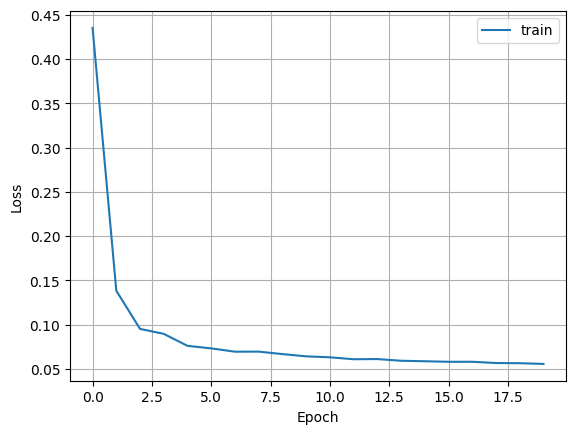

In [13]:
import matplotlib.pyplot as plt

train_losses = [i.to('cpu').detach().numpy() for i in model.training_epoch_losses]

plt.plot(train_losses, label='train')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid()
plt.show()

## Step6. Test ##

In [14]:
import einops
import imageio
import numpy as np
def generate_new_images(n_samples=16,  frames_per_gif=100, gif_name="sampling.gif", c=1, h=28, w=28):
    """Given a DDPM model, a number of samples to be generated and a device, returns some newly generated samples"""
    frame_idxs = np.linspace(0, model.ddpm.n_steps, frames_per_gif).astype(np.uint)
    frames = []

    with torch.no_grad():
        #if device is None:
        #    device = model.ddpm.device

        # Starting from random noise
        x = torch.randn(n_samples, c, h, w)#.to(device)
        list_steps = list(range(model.ddpm.n_steps))[::-1]
        list_steps = [list_steps[i*10] for i in range(int(model.ddpm.n_steps/10))]
        list_steps.append(0)

        for idx, t in enumerate(list(range(model.ddpm.n_steps))[::-1]):
        #for idx, t in enumerate(list_steps):
            # Estimating noise to be removed
            time_tensor = (torch.ones(n_samples, 1) * t).to(model.device).long()
            eta_theta = model.ddpm.backward(x, time_tensor)

            alpha_t = model.ddpm.alphas[t]
            alpha_t_bar = model.ddpm.alpha_bars[t]

            # Partially denoising the image
            x = (1 / alpha_t.sqrt()) * (x - (1 - alpha_t) / (1 - alpha_t_bar).sqrt() * eta_theta)

            if t > 0:
                z = torch.randn(n_samples, c, h, w)#.to(device)

                # Option 1: sigma_t squared = beta_t
                beta_t = model.ddpm.betas[t]
                sigma_t = beta_t.sqrt()

                # Option 2: sigma_t squared = beta_tilda_t
                # prev_alpha_t_bar = ddpm.alpha_bars[t-1] if t > 0 else ddpm.alphas[0]
                # beta_tilda_t = ((1 - prev_alpha_t_bar)/(1 - alpha_t_bar)) * beta_t
                # sigma_t = beta_tilda_t.sqrt()

                # Adding some more noise like in Langevin Dynamics fashion
                x = x + sigma_t * z
            #frames.append(make_grid(x, nrow=8))
            #'''
            # Adding frames to the GIF
            if idx in frame_idxs or t == 0:
                # Putting digits in range [0, 255]
                normalized = x.clone()
                for i in range(len(normalized)):
                    normalized[i] -= torch.min(normalized[i])
                    normalized[i] *= 255 / torch.max(normalized[i])

                # Reshaping batch (n, c, h, w) to be a (as much as it gets) square frame
                frame = einops.rearrange(normalized, "(b1 b2) c h w -> (b1 h) (b2 w) c", b1=int(n_samples ** 0.5))
                frame = frame.cpu().numpy().astype(np.uint8)

                # Rendering frame
                frames.append(frame)
            #'''
    #'''
    # Storing the gif
    with imageio.get_writer(gif_name, mode="I") as writer:
        for idx, frame in enumerate(frames):
            print(type(frame), frame.shape)
            if type(frame) == torch.Tensor:
                frame = frame.to('cpu').detach().numpy()
            else:
                frame = np.array([frame[:,:,0], frame[:,:,0], frame[:,:,0]])
            writer.append_data(frame)
            #if idx == len(frames) - 1:
            #    for _ in range(frames_per_gif // 3):
            #        writer.append_data(frames[-1])
    #'''
    return frames

In [15]:
generated = generate_new_images(
        n_samples=100
    )

<class 'numpy.ndarray'> (280, 280, 1)
<class 'numpy.ndarray'> (280, 280, 1)
<class 'numpy.ndarray'> (280, 280, 1)
<class 'numpy.ndarray'> (280, 280, 1)
<class 'numpy.ndarray'> (280, 280, 1)
<class 'numpy.ndarray'> (280, 280, 1)
<class 'numpy.ndarray'> (280, 280, 1)
<class 'numpy.ndarray'> (280, 280, 1)
<class 'numpy.ndarray'> (280, 280, 1)
<class 'numpy.ndarray'> (280, 280, 1)
<class 'numpy.ndarray'> (280, 280, 1)
<class 'numpy.ndarray'> (280, 280, 1)
<class 'numpy.ndarray'> (280, 280, 1)
<class 'numpy.ndarray'> (280, 280, 1)
<class 'numpy.ndarray'> (280, 280, 1)
<class 'numpy.ndarray'> (280, 280, 1)
<class 'numpy.ndarray'> (280, 280, 1)
<class 'numpy.ndarray'> (280, 280, 1)
<class 'numpy.ndarray'> (280, 280, 1)
<class 'numpy.ndarray'> (280, 280, 1)
<class 'numpy.ndarray'> (280, 280, 1)
<class 'numpy.ndarray'> (280, 280, 1)
<class 'numpy.ndarray'> (280, 280, 1)
<class 'numpy.ndarray'> (280, 280, 1)
<class 'numpy.ndarray'> (280, 280, 1)
<class 'numpy.ndarray'> (280, 280, 1)
<class 'nump

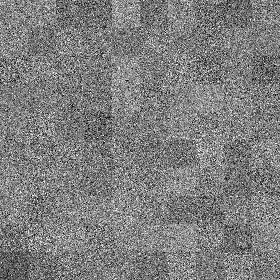

In [16]:
from IPython.display import Image

Image(open('sampling.gif','rb').read())

In [17]:
def gen(n_samples, c=1, h=28, w=28):
    list_imgs = []
    x = torch.randn(n_samples, c, h, w)

    list_steps = list(range(model.ddpm.n_steps))[::-1]
    list_steps = [list_steps[i*10] for i in range(int(model.ddpm.n_steps/10))]
    list_steps.append(0)
    for idx, t in enumerate(list_steps):
        print(idx, len(list(range(model.ddpm.n_steps))[::-1]))
        time_tensor = (torch.ones(n_samples, 1) * t).to(model.device).long()
        eta_theta = model.ddpm.backward(x, time_tensor)

        alpha_t = model.ddpm.alphas[t]
        alpha_t_bar = model.ddpm.alpha_bars[t]

        # Partially denoising the image
        x = (1 / alpha_t.sqrt()) * (x - (1 - alpha_t) / (1 - alpha_t_bar).sqrt() * eta_theta)

        if t > 0:
            z = torch.randn(n_samples, c, h, w).to(model.device)

            # Option 1: sigma_t squared = beta_t
            beta_t = model.ddpm.betas[t]
            sigma_t = beta_t.sqrt()

            # Option 2: sigma_t squared = beta_tilda_t
            # prev_alpha_t_bar = ddpm.alpha_bars[t-1] if t > 0 else ddpm.alphas[0]
            # beta_tilda_t = ((1 - prev_alpha_t_bar)/(1 - alpha_t_bar)) * beta_t
            # sigma_t = beta_tilda_t.sqrt()

            # Adding some more noise like in Langevin Dynamics fashion
            x = x + sigma_t * z
            list_imgs.append(make_grid(x.squeeze(0), nrow=8))



    return list_imgs

In [18]:
foo = list(range(model.ddpm.n_steps))[::-1]
foo = [foo[i*10] for i in range(int(model.ddpm.n_steps/10))]
foo.append(0)
len(foo)

101

In [19]:
int(model.ddpm.n_steps/10+1)

101

In [20]:
img_raw = gen(n_samples=64)

0 1000
1 1000
2 1000
3 1000
4 1000
5 1000
6 1000
7 1000
8 1000
9 1000
10 1000
11 1000
12 1000
13 1000
14 1000
15 1000
16 1000
17 1000
18 1000
19 1000
20 1000
21 1000
22 1000
23 1000
24 1000
25 1000
26 1000
27 1000
28 1000
29 1000
30 1000
31 1000
32 1000
33 1000
34 1000
35 1000
36 1000
37 1000
38 1000
39 1000
40 1000
41 1000
42 1000
43 1000
44 1000
45 1000
46 1000
47 1000
48 1000
49 1000
50 1000
51 1000
52 1000
53 1000
54 1000
55 1000
56 1000
57 1000
58 1000
59 1000
60 1000
61 1000
62 1000
63 1000
64 1000
65 1000
66 1000
67 1000
68 1000
69 1000
70 1000
71 1000
72 1000
73 1000
74 1000
75 1000
76 1000
77 1000
78 1000
79 1000
80 1000
81 1000
82 1000
83 1000
84 1000
85 1000
86 1000
87 1000
88 1000
89 1000
90 1000
91 1000
92 1000
93 1000
94 1000
95 1000
96 1000
97 1000
98 1000
99 1000
100 1000


In [21]:
img_raw[99].shape

torch.Size([3, 242, 242])

In [22]:
foo=img_raw[99][0]

In [23]:
foo -= torch.min(foo)
foo *= 255 / torch.max(foo)

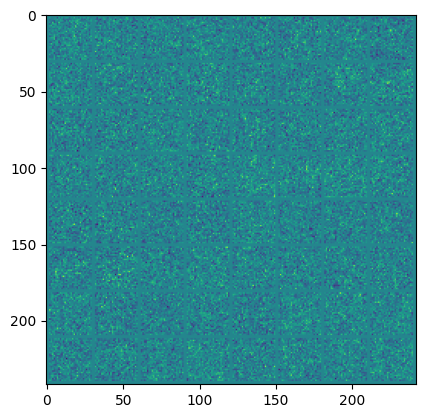

In [24]:
import matplotlib.pyplot as plt
#plt.imshow(img_raw[99][2].to('cpu').detach().numpy())
plt.imshow(foo.to('cpu').detach().numpy())
plt.show()

In [25]:
def generate(self, n_samples, c=1, h=28, w=28):
        #frame_idxs = torch.linspace(0, self.ddpm.n_steps, self.ddpm.n_steps)
        #frames = []
        x = torch.randn(n_samples, c, h, w)

        for idx, t in enumerate(list(range(self.ddpm.n_steps))[::-1]):
                # Estimating noise to be removed
                time_tensor = (torch.ones(n_samples, 1) * t).to(self.device).long()
                eta_theta = self.ddpm.backward(x, time_tensor)

                alpha_t = self.ddpm.alphas[t]
                alpha_t_bar = self.ddpm.alpha_bars[t]

                # Partially denoising the image
                x = (1 / alpha_t.sqrt()) * (x - (1 - alpha_t) / (1 - alpha_t_bar).sqrt() * eta_theta)

                if t > 0:
                    z = torch.randn(n_samples, c, h, w).to(self.device)

                    # Option 1: sigma_t squared = beta_t
                    beta_t = self.ddpm.betas[t]
                    sigma_t = beta_t.sqrt()

                    # Option 2: sigma_t squared = beta_tilda_t
                    # prev_alpha_t_bar = ddpm.alpha_bars[t-1] if t > 0 else ddpm.alphas[0]
                    # beta_tilda_t = ((1 - prev_alpha_t_bar)/(1 - alpha_t_bar)) * beta_t
                    # sigma_t = beta_tilda_t.sqrt()

                    # Adding some more noise like in Langevin Dynamics fashion
                    x = x + sigma_t * z

                # Adding frames to the GIF
                '''
                if idx in frame_idxs or t == 0:
                    # Putting digits in range [0, 255]
                    normalized = x.clone()
                    for i in range(len(normalized)):
                        normalized[i] -= torch.min(normalized[i])
                        normalized[i] *= 255 / torch.max(normalized[i])

                    # Reshaping batch (n, c, h, w) to be a (as much as it gets) square frame
                    #frame = einops.rearrange(normalized, "(b1 b2) c h w -> (b1 h) (b2 w) c", b1=int(n_samples ** 0.5))
                    #frame = frame.cpu().numpy().astype(np.uint8)
                    frame=normalized

                    # Rendering frame
                    frames.append(frame)
                '''
        
        return x

In [26]:
#img_raw=model.generate(n_samples=64)